In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numba import jit 

In [2]:
@jit(nopython=True)
def lyapunov(x=0.5, r=4.0):
    for i in range(10000): x = r * x * (1 - x)
    NLYAP = 100000
    total = 0
    for _ in range(NLYAP):
        x = r * x * (1 - x)
        total += np.log2(np.abs(r - 2 * r * x))
    return total / NLYAP

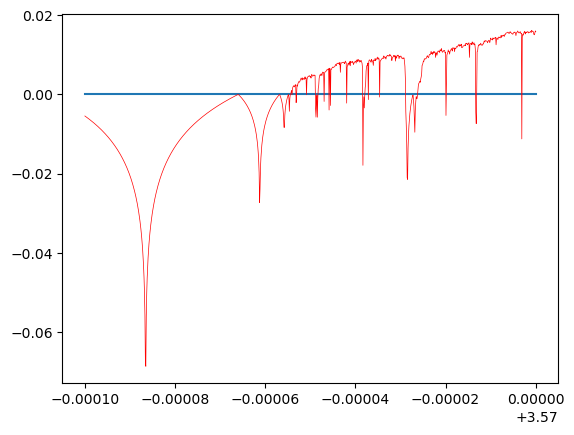

In [3]:
x = np.linspace(3.5699,3.57,1000)
plt.plot(x, np.zeros_like(x))
plt.plot(x, [lyapunov(r=r) for r in x], 'r', linewidth=.5)
plt.show()

In [4]:
#import string
#from datashader import transfer_functions as tf
#from datashader.colors import inferno, viridis, Hot
#import datashader as ds
import pandas as pd
import matplotlib.pyplot as plt


@jit(nopython=True)
def lf(s, NPOINTS, h_range, v_range, param):
    TRANSIENT=100
    Sp=np.array([0 if x=='A' else 1 for x in s]*(NPOINTS // len(s) + TRANSIENT + 1))
    h_points = np.arange(*h_range, (h_range[1] - h_range[0]) / NPOINTS)
    v_points = np.arange(*v_range, (v_range[1] - v_range[0]) / NPOINTS)
    a = np.array([[[p for p in h_points] for _ in range(NPOINTS)],
         [[p for _ in range(NPOINTS)] for p in v_points]])
    color = np.zeros_like(a[0])
    x = np.ones_like(color) * 0.5
    # transient step
    for S in Sp[:TRANSIENT]:
        r = a[S]
        x = r * x * (1 - x)
    # now proceed to the fractal
    for S in Sp[TRANSIENT:]:
        r = a[S]
        x = r * x * (1 - x)
        yy = np.abs(r - 2 * r * x)
        color += np.log2(np.where(yy > 0, yy, 1e-10))
    #color /= len(Sp)
    return color
  
#@jit#(nopython=True)
def lyaf(s, lf=lf, **op):
    #letters = "AB"
    #dletters = dict([(x, letters.index(x)) for x in letters])
    #S = [dletters[x] for x in s for j in range(iter // len(s) + 1)]
    op_default = {"cmap":'flag', "NPOINTS":1200, "h_range":(2,4), "v_range":(2,4), "param":None}
    if op is None:
        op = op_default.copy()
    else:
        opd = op_default.copy()
        opd.update(op)
        op = opd
    
    h = op["h_range"]
    v = op["v_range"]
    color = lf(s, NPOINTS=op["NPOINTS"], h_range=h, v_range=v, param=op["param"])
    plt.figure(figsize=(11*(h[1]-h[0])/(v[1]-v[0]), 11))
    img = plt.imshow(color, origin='lower', aspect='auto')
    img.set_cmap(op["cmap"])
    plt.axis('off')
    #plt.savefig("test.png", bbox_inches='tight')
    plt.show()
    


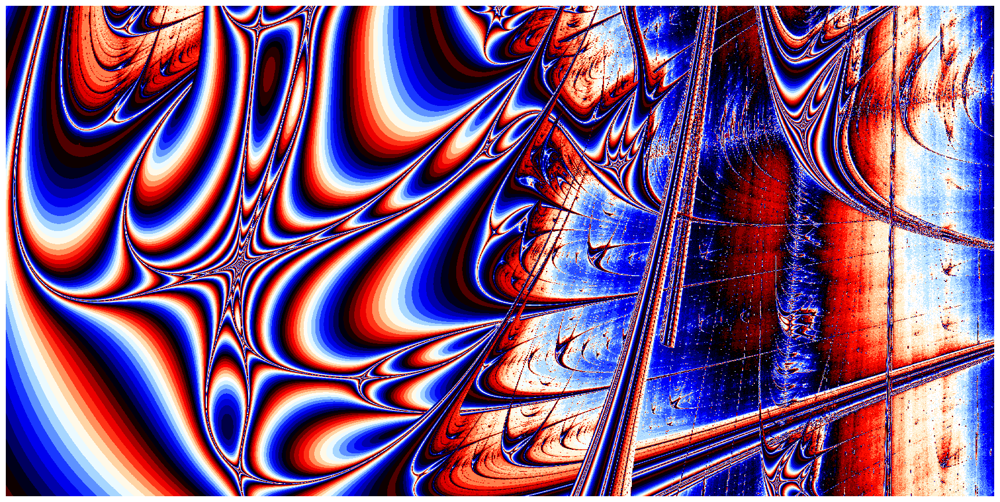

CPU times: user 21.5 s, sys: 4.74 s, total: 26.3 s
Wall time: 25.9 s


In [5]:
%time lyaf("AABAB", h_range=(3,4), v_range=(3,3.5))

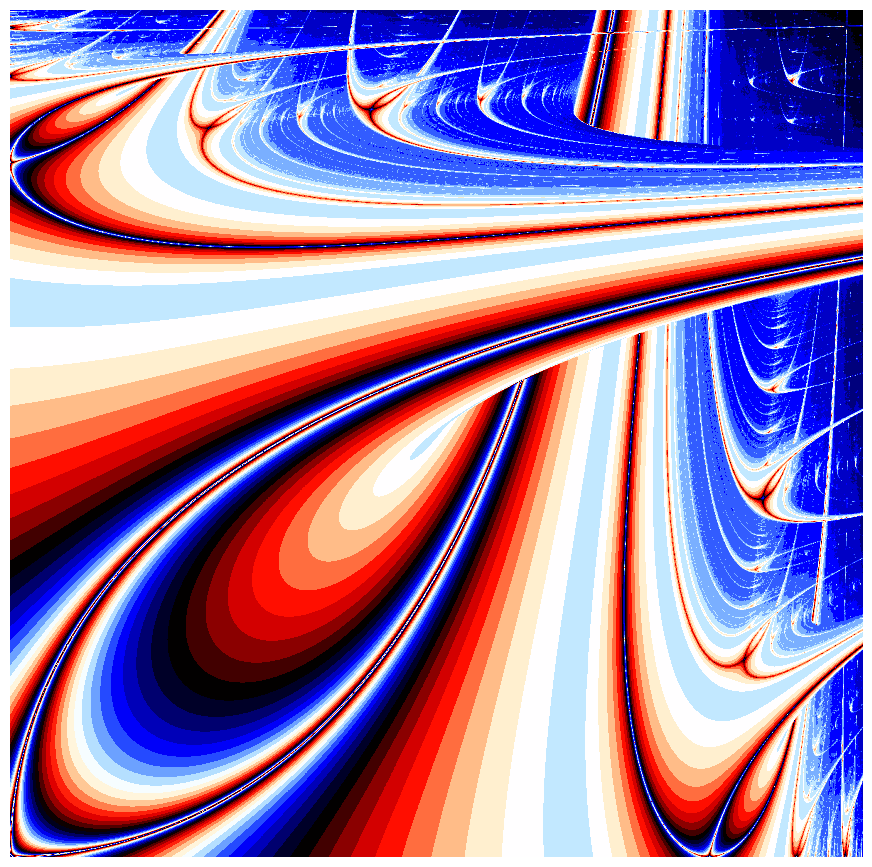

CPU times: user 15.7 s, sys: 3.28 s, total: 19 s
Wall time: 18.8 s


In [6]:
%time lyaf("BA")

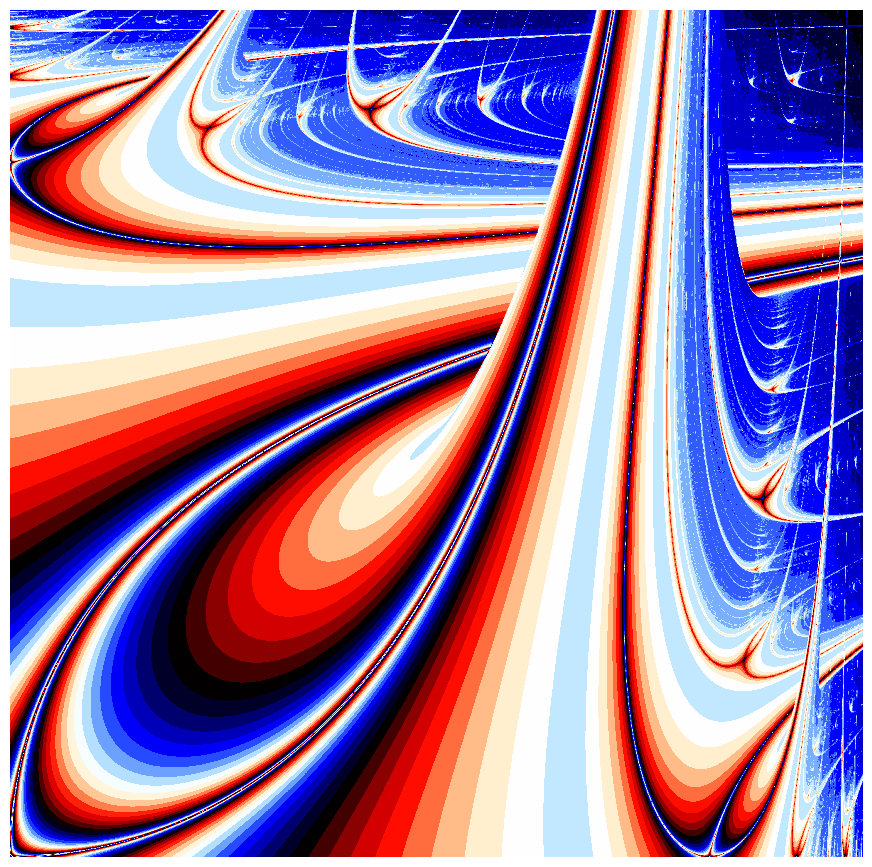

CPU times: user 15.5 s, sys: 3.24 s, total: 18.7 s
Wall time: 18.2 s


In [7]:
%time lyaf("AB")

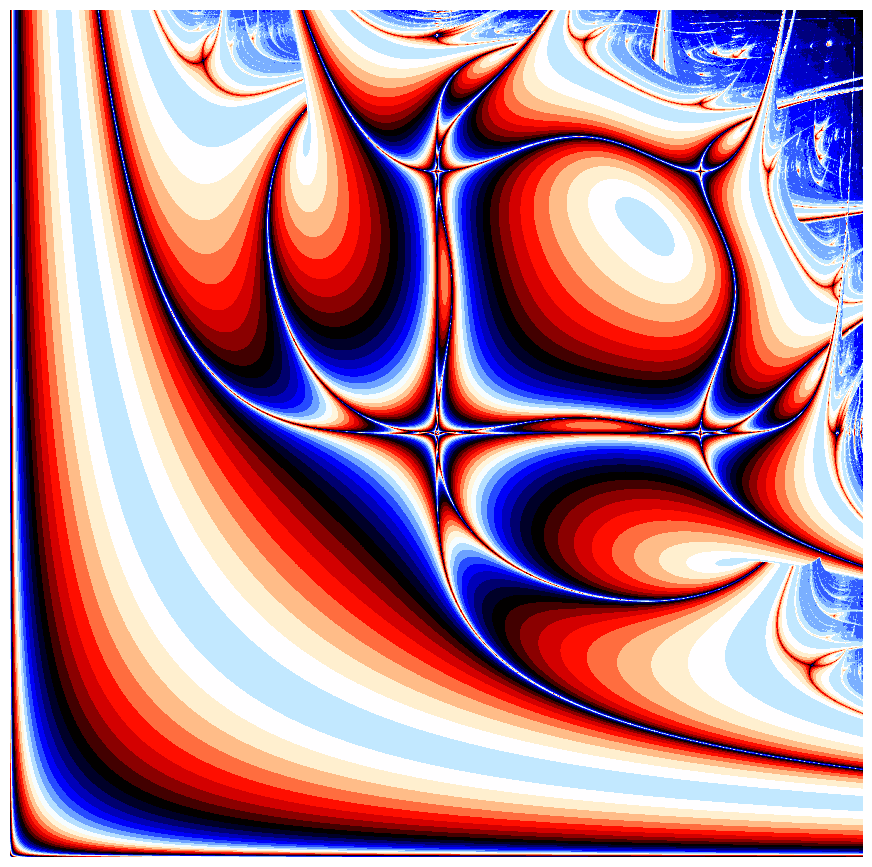

CPU times: user 17.3 s, sys: 3.69 s, total: 21 s
Wall time: 20.5 s


In [8]:
%time lyaf("AABB", h_range=(0,4), v_range=(0,4))

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

    
@jit(nopython=True)
def lf2(s, NPOINTS, h_range, v_range, param):
    TRANSIENT=600
    Sp=np.array([0 if x=='A' else 1 for x in s]*(NPOINTS // len(s) + TRANSIENT + 1))
    h_points = np.arange(*h_range, (h_range[1] - h_range[0]) / NPOINTS)
    v_points = np.arange(*v_range, (v_range[1] - v_range[0]) / NPOINTS)
    a = np.array([[[p for p in h_points] for _ in range(NPOINTS)],
         [[p for _ in range(NPOINTS)] for p in v_points]])
    color = np.zeros_like(a[0])
    x = np.ones_like(color) * 0.5
    b = param[0]
    for S in Sp[:TRANSIENT]:
        r = a[S]
        x = b * np.sin(x + r) ** 2
    for S in Sp[TRANSIENT:]:
        r = a[S]
        x = b * np.sin(x + r) ** 2
        yy = np.abs(2 * b * np.sin(x + r)* np.cos(x + r))
        color += np.log2(np.where(yy > 0, yy, 1e-10))
    #color /= len(Sp)
    return color

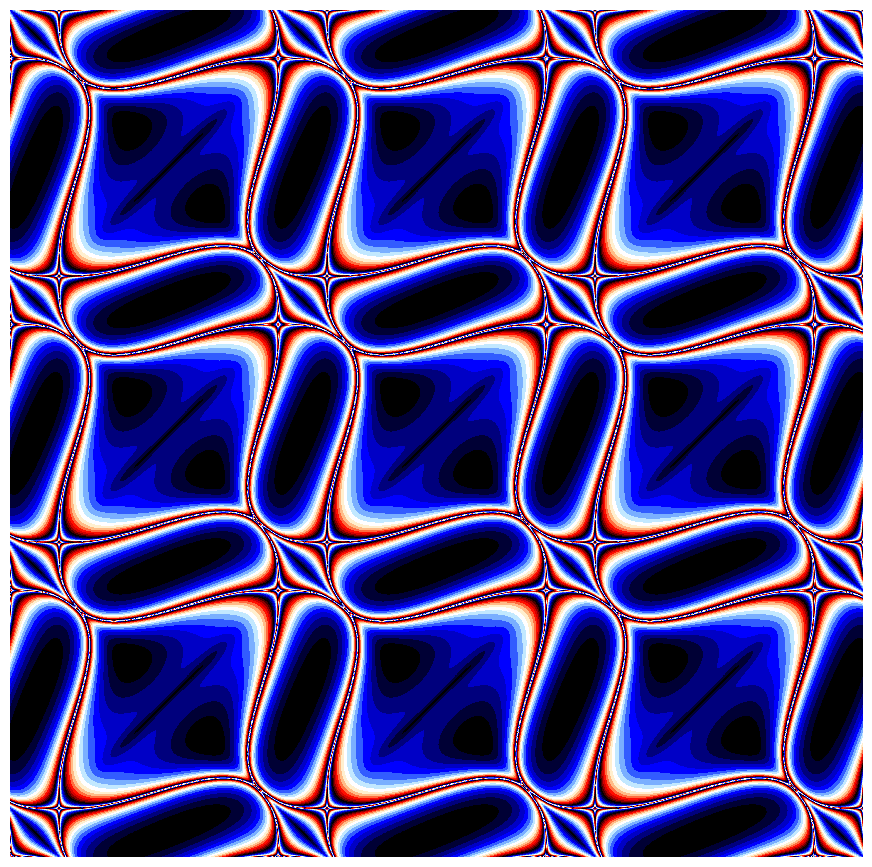

CPU times: user 51.6 s, sys: 5.37 s, total: 57 s
Wall time: 56.5 s


In [10]:
%time lyaf("AB", lf=lf2, h_range=(0,10), v_range=(0,10), param=(1,))

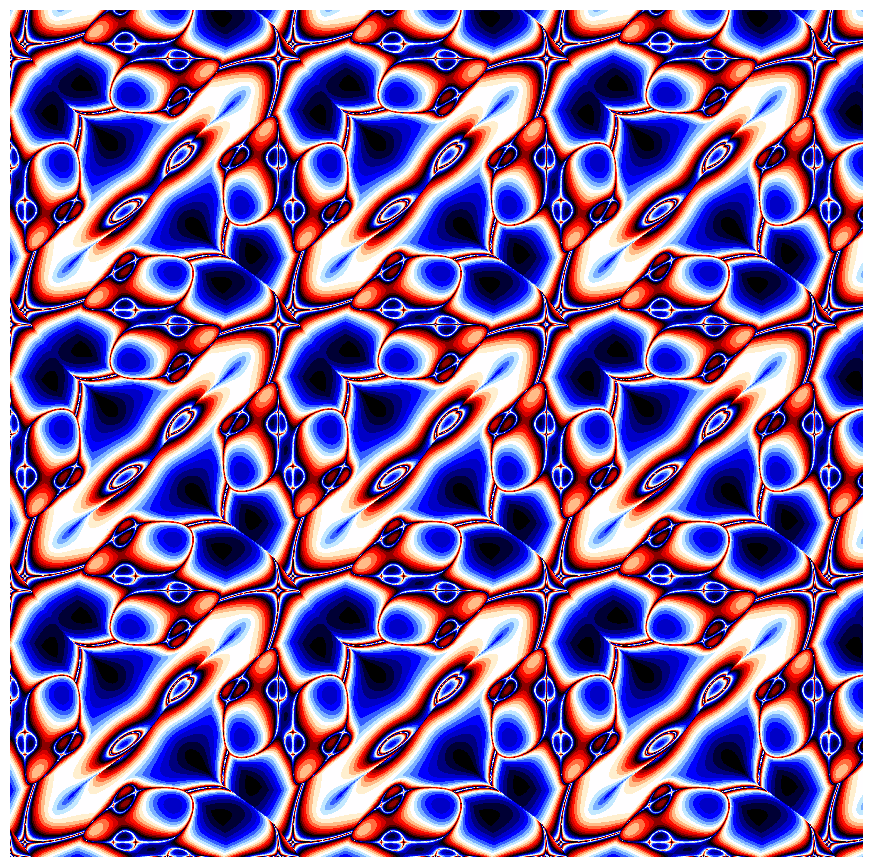

CPU times: user 52 s, sys: 5.16 s, total: 57.2 s
Wall time: 56.7 s


In [11]:
%time lyaf("AB", lf=lf2, h_range=(0,10), v_range=(0,10), param=(1.4,))

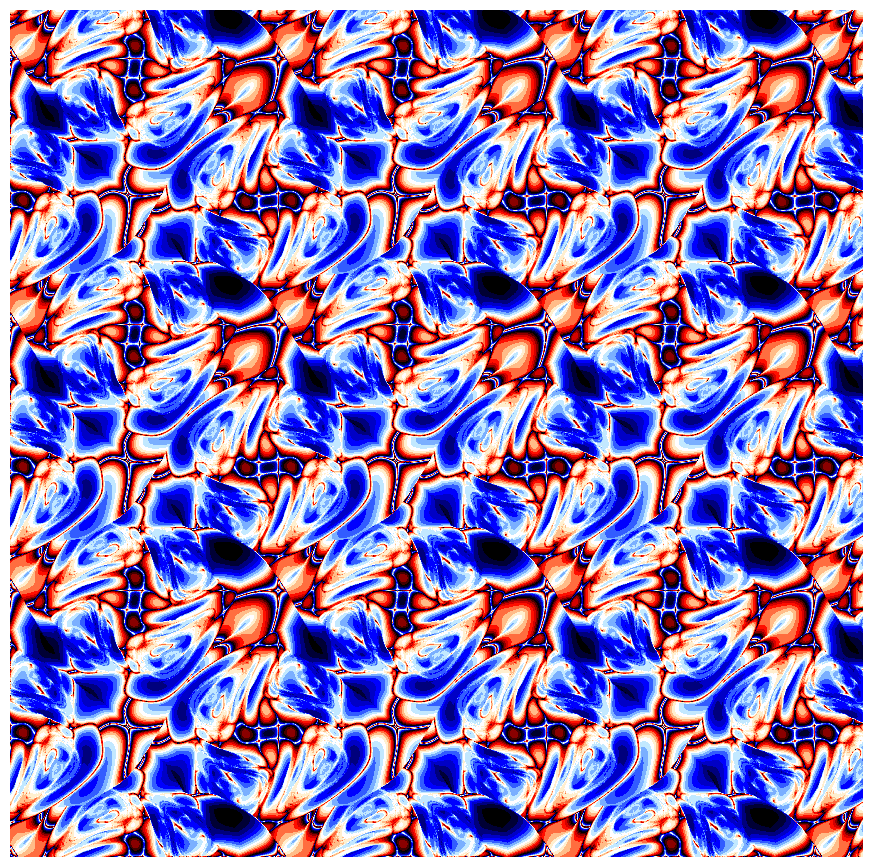

CPU times: user 58.3 s, sys: 5.45 s, total: 1min 3s
Wall time: 1min 3s


In [12]:
%time lyaf("AB", lf2, h_range=(0,10), v_range=(0,10), param=(1.8,))

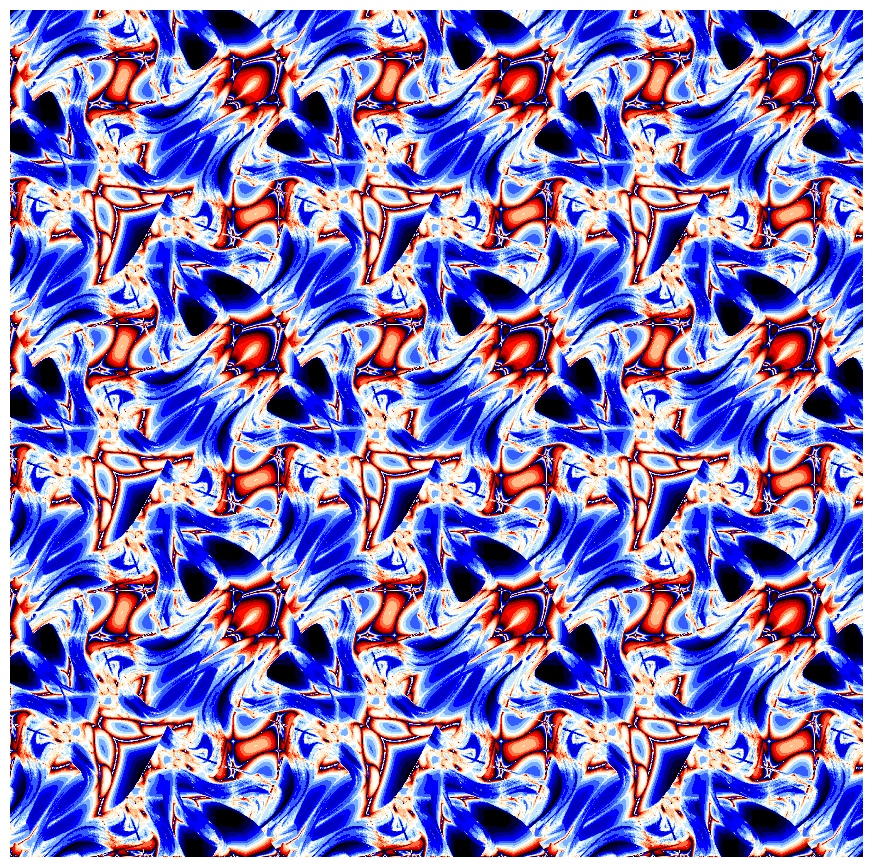

CPU times: user 1min 4s, sys: 5.43 s, total: 1min 10s
Wall time: 1min 9s


In [13]:
%time lyaf("AB", lf2, h_range=(0,10), v_range=(0,10), param=(2.1,))

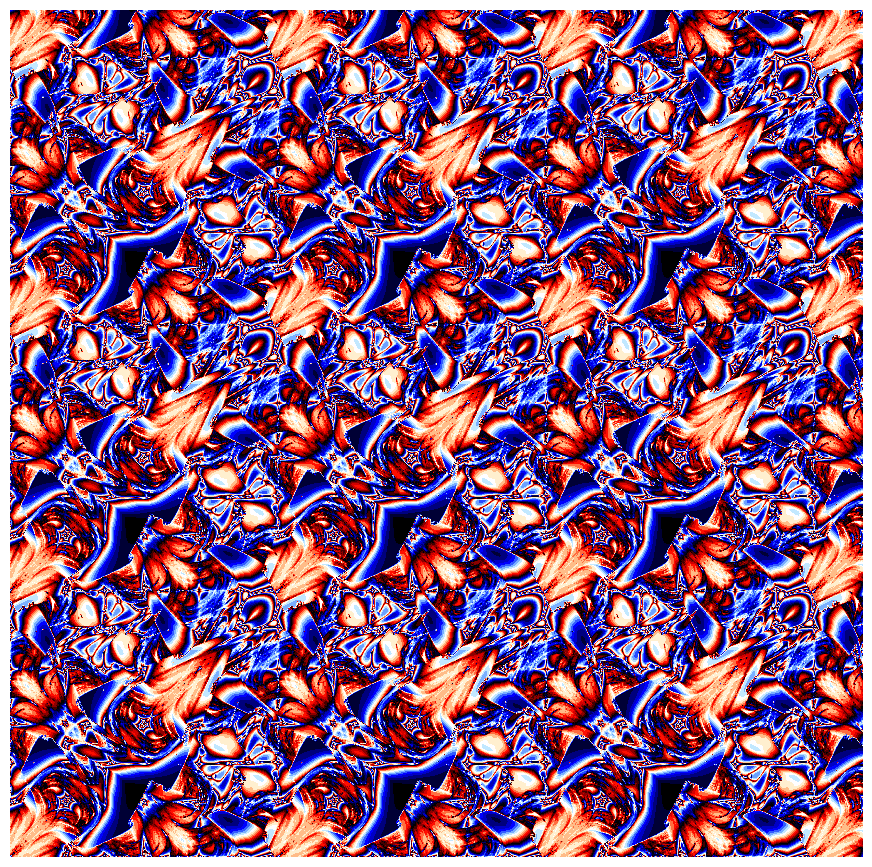

CPU times: user 1min 9s, sys: 5.5 s, total: 1min 15s
Wall time: 1min 15s


In [14]:
%time lyaf("AB", lf2, h_range=(0,10), v_range=(0,10), param=(2.5,))

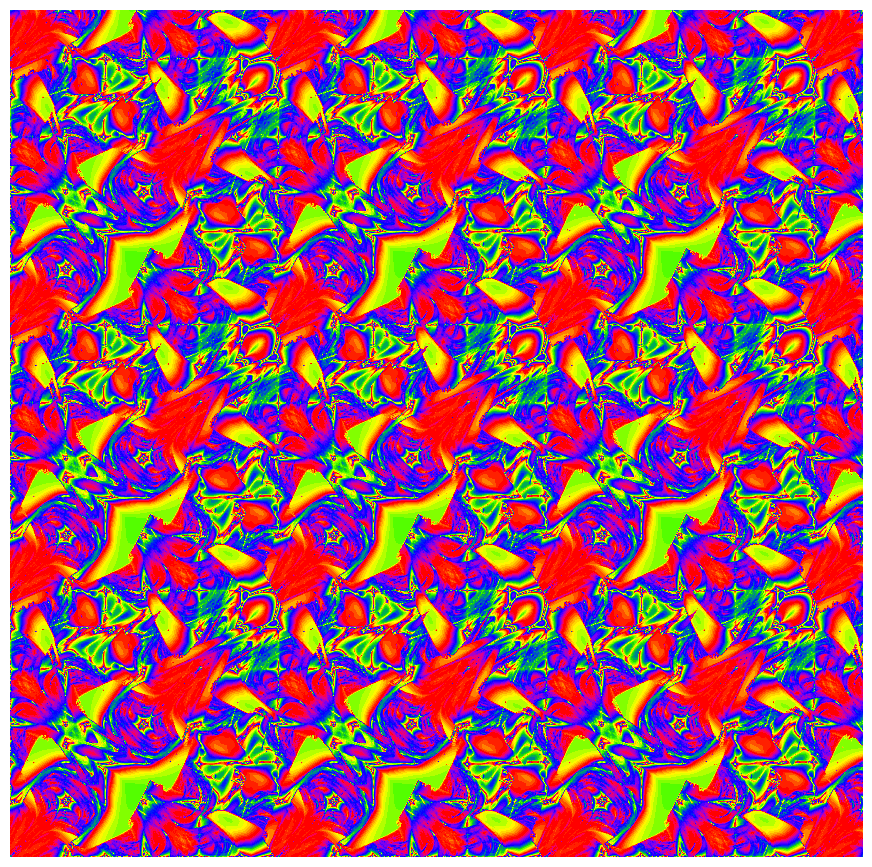

CPU times: user 1min 9s, sys: 5.56 s, total: 1min 15s
Wall time: 1min 14s


In [15]:
%time lyaf("AB", lf2, h_range=(0,10), v_range=(0,10), param=(2.5,), cmap='prism')

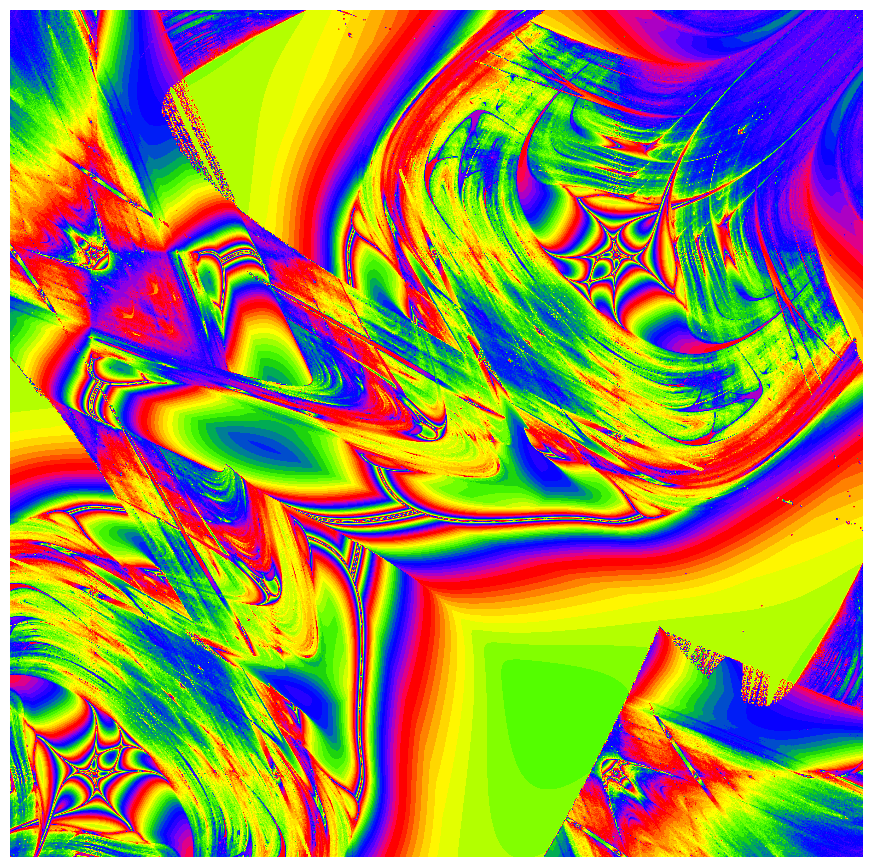

CPU times: user 41.7 s, sys: 3.43 s, total: 45.1 s
Wall time: 44.7 s


In [16]:
%time lyaf("AB", lf2, h_range=(0.5,2), v_range=(0.5,2), param=(2.5,), NPOINTS=1000, cmap='prism')

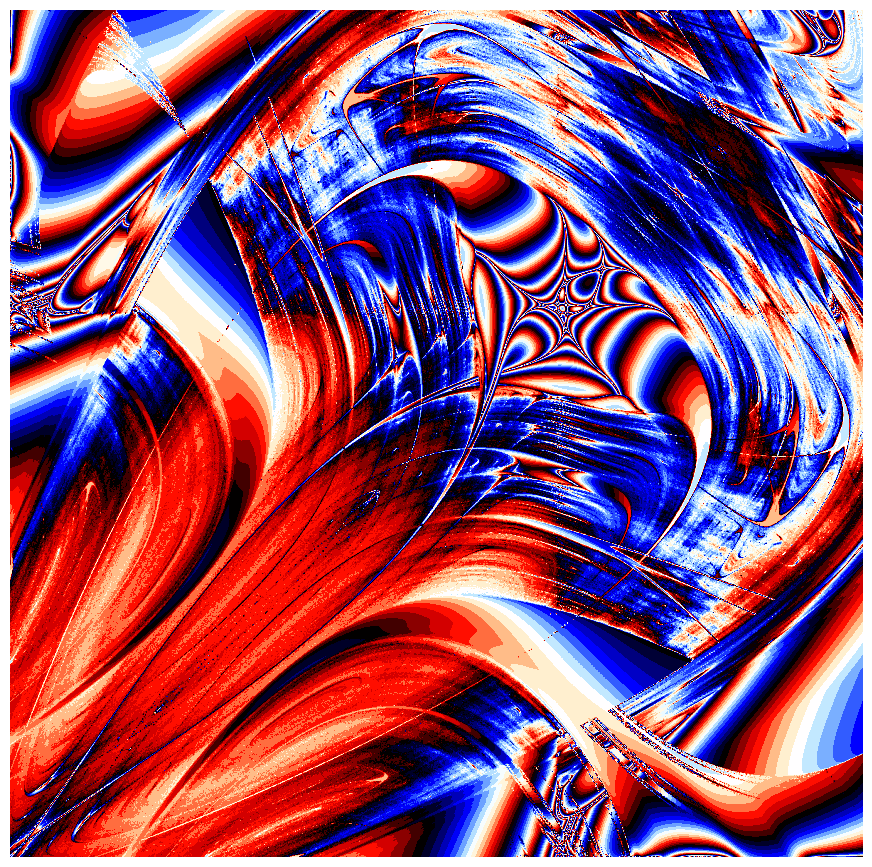

CPU times: user 1min 14s, sys: 5.39 s, total: 1min 20s
Wall time: 1min 19s


In [17]:
%time lyaf("AB", lf2, h_range=(0,1), v_range=(0,1), param=(2.5,))

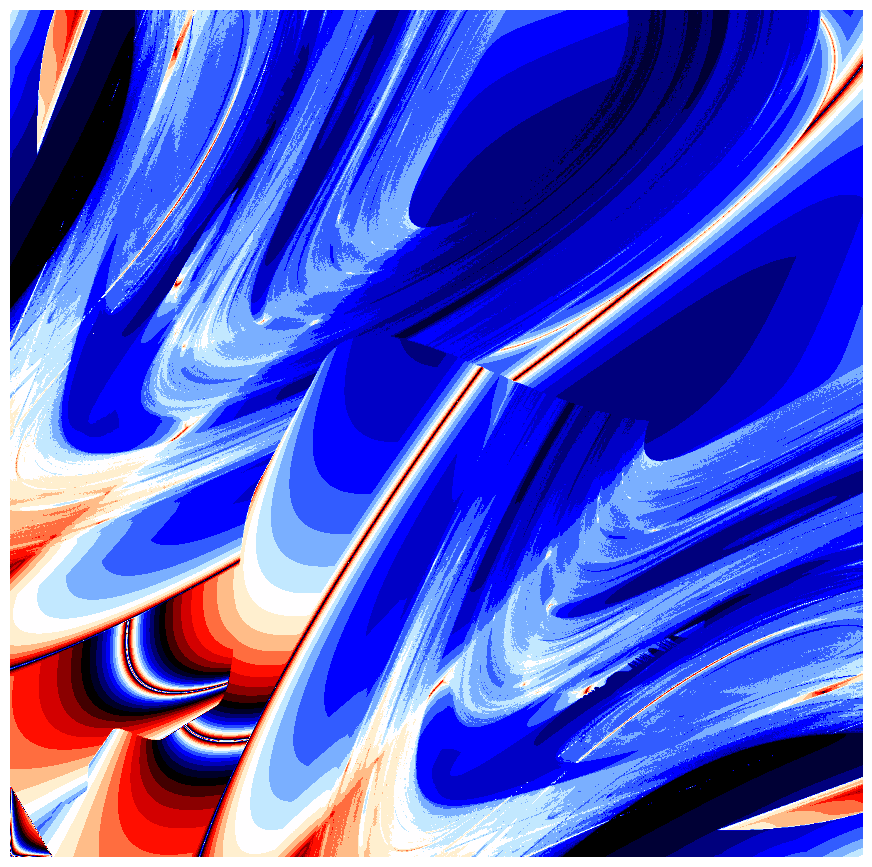

CPU times: user 1min, sys: 5.5 s, total: 1min 6s
Wall time: 1min 5s


In [18]:
%time lyaf("AB", lf2, h_range=(0,1), v_range=(0,1), param=(1.95,))

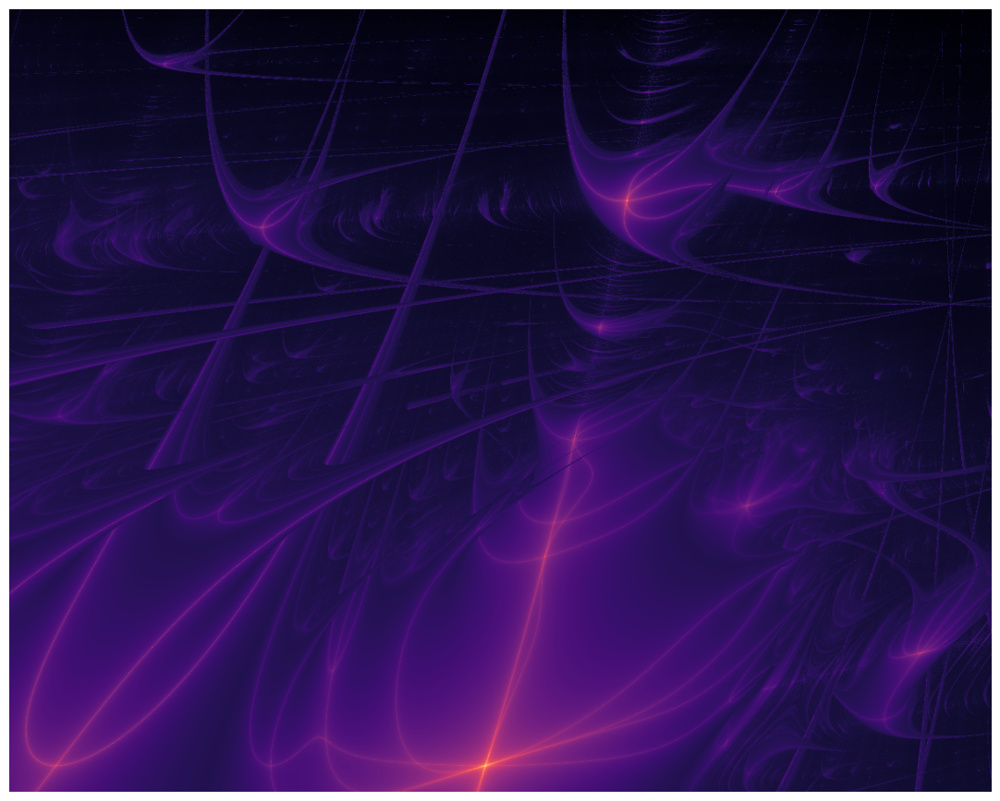

CPU times: user 23.6 s, sys: 4.28 s, total: 27.9 s
Wall time: 27.1 s


In [19]:
%time lyaf("BBABABA", cmap="magma_r", h_range=(2.759, 3.744), v_range=(3.21,4))

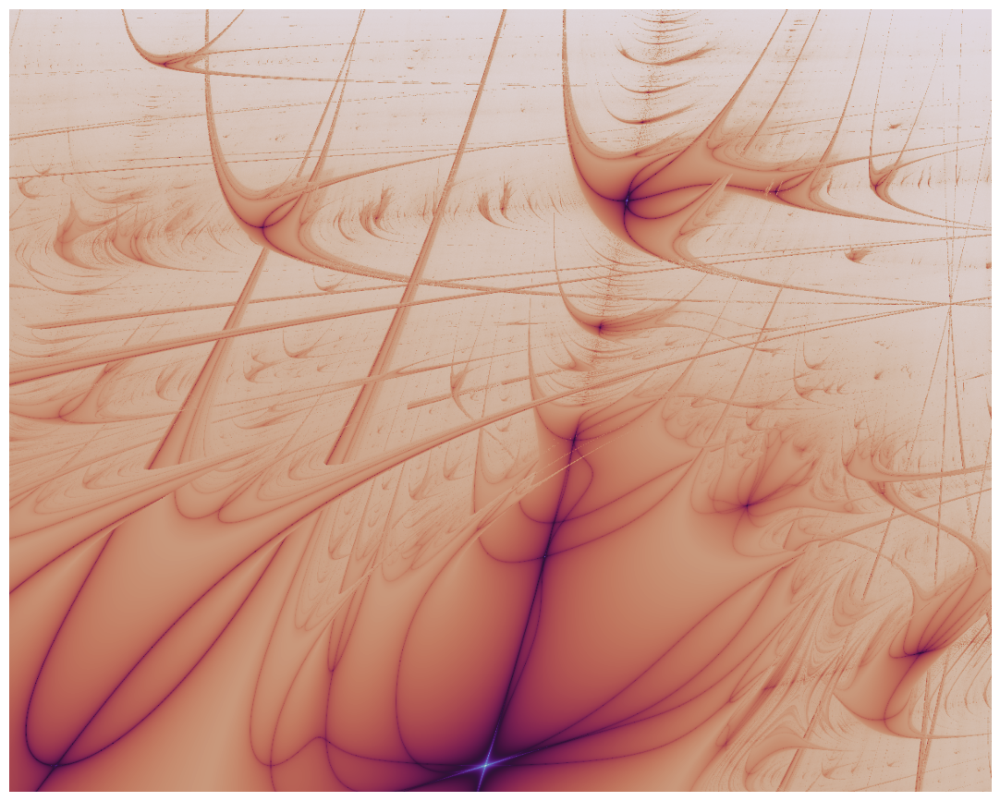

CPU times: user 23.1 s, sys: 4.42 s, total: 27.5 s
Wall time: 26.8 s


In [20]:
%time lyaf("BBABABA", cmap="twilight", h_range=(2.759, 3.744), v_range=(3.21,4))

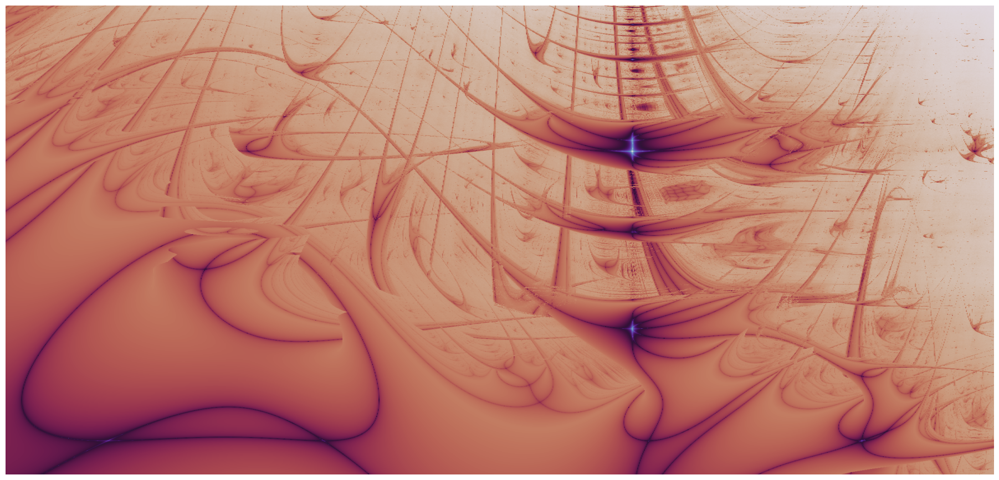

CPU times: user 28.7 s, sys: 5.52 s, total: 34.3 s
Wall time: 33.6 s


In [21]:
%time lyaf("BBBBBBAAAAAA", cmap="twilight", h_range=(2.52, 3.65), v_range=(3.46,4))

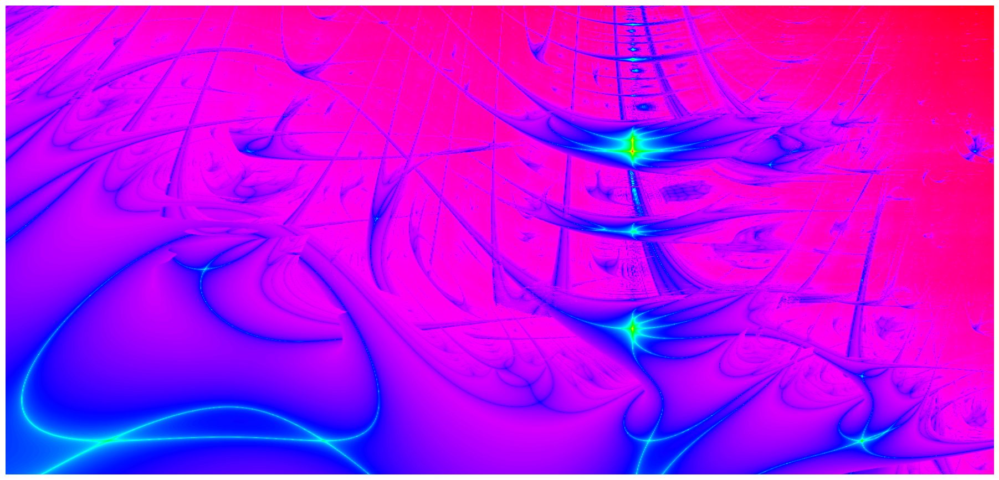

CPU times: user 18.4 s, sys: 3.77 s, total: 22.2 s
Wall time: 21.7 s


In [22]:
%time lyaf("BBBBBBAAAAAA", cmap="hsv", h_range=(2.52, 3.65), v_range=(3.46,4), NPOINTS=1000)

In [23]:
@jit(nopython=True)
def lf3(s, NPOINTS, h_range, v_range, param):
    TRANSIENT=600
    Sp=np.array([0 if x=='A' else 1 for x in s]*(NPOINTS // len(s) + TRANSIENT + 1))
    h_points = np.arange(*h_range, (h_range[1] - h_range[0]) / NPOINTS)
    v_points = np.arange(*v_range, (v_range[1] - v_range[0]) / NPOINTS)
    a = np.array([[[p for p in h_points] for _ in range(NPOINTS)],
         [[p for _ in range(NPOINTS)] for p in v_points]])
    color = np.zeros_like(a[0])
    x = np.ones_like(color) * 0.5
    for S in Sp[:TRANSIENT]:
        r = a[S]
        x = r * np.cos(x)
    for S in Sp[TRANSIENT:]:
        r = a[S]
        x = r * np.cos(x)
        yy = np.abs(- r * np.sin(x))
        color += np.log2(np.where(yy > 0, yy, 1e-10))
    #color /= len(Sp)
    return color

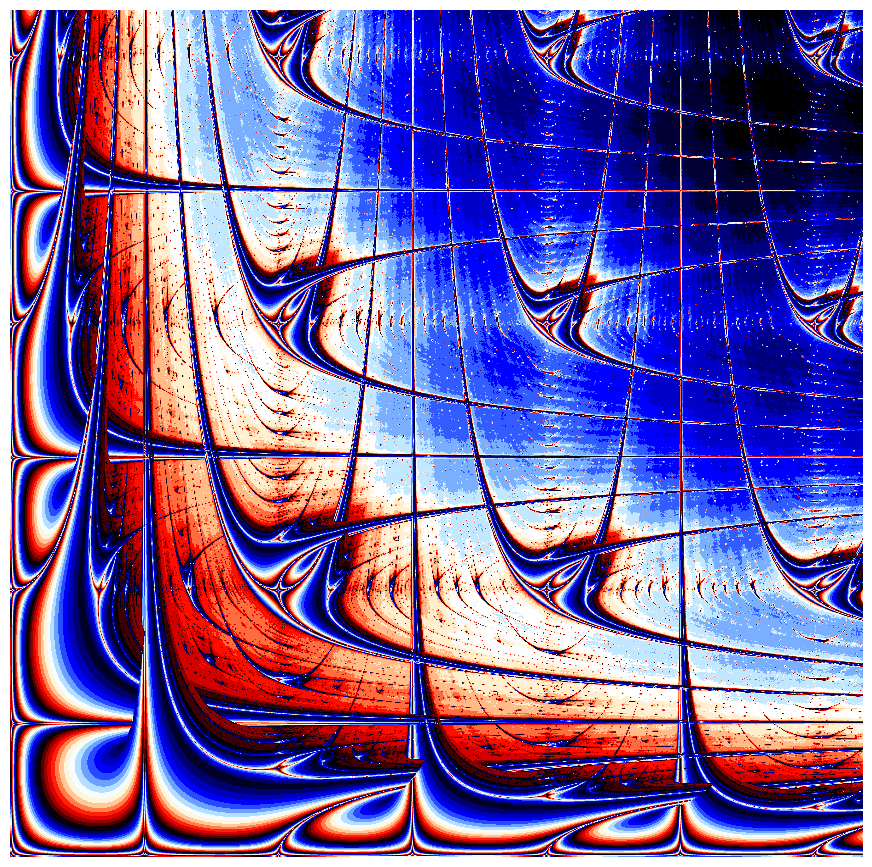

CPU times: user 37.3 s, sys: 3.45 s, total: 40.7 s
Wall time: 40.4 s


In [24]:
%time lyaf("AB", lf3,  cmap="flag", h_range=(0, 10), v_range=(0,10), param=(.1,), NPOINTS=1000)